# osmnx - extract osm road layer
---
goal
1. TIFF를 읽어 bounding을 읽어들임
2. 해당 구역의 도로 정보를 불러옴
3. 기존 TIFF 데이터에 2의 도로 정보를 추가하여 저장한다.

In [1]:
%matplotlib inline
import json
import os
import glob
import folium
import csv
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

from shapely import wkt
from shapely import affinity
from tqdm.notebook import tqdm
import shapely
import osmnx as ox

import rasterio
from rasterio.plot import show

import numpy as np

import cv2

In [2]:
import warnings
warnings.filterwarnings(action='ignore')

In [3]:
!pwd

/home/aiffel-dj1/workspace/Hackerton/workspace/EDA/OSM


In [4]:
BASE_PATH = os.path.join(os.getenv('HOME'), 'workspace/Hackerton') # project folder
DATA_PATH = os.path.join(BASE_PATH, 'RSI_OP_NIA_AIHUB') # data folder

## 1. SAMPLE
---

In [97]:
SAMPLE_TIFF_PATH = os.path.join(DATA_PATH, 'buildings/validation/raw/BLD00096_PS4_K3A_NIA0276.tif') # sample geojson file path
SAMPLE_BACKGROUND_PATH = os.path.join(DATA_PATH, 'buildings/validation/raw/BLD00096_PS3_K3A_NIA0276.png')

### A. load TIFF

In [6]:
src = rasterio.open(SAMPLE_TIFF_PATH)
src.meta

{'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': None,
 'width': 1024,
 'height': 1024,
 'count': 4,
 'crs': CRS.from_epsg(32636),
 'transform': Affine(0.55, 0.0, 346268.00134696,
        0.0, -0.55, 3321588.47693567)}

In [7]:
src.bounds

BoundingBox(left=346268.00134696, bottom=3321025.2769356696, right=346831.20134696004, top=3321588.47693567)

✊ 좌표변환 필요
- epsg:32636 to epsg:4326

In [8]:
from rasterio.warp import transform_bounds
from rasterio.crs import CRS

left, bottom, right, top  = transform_bounds(
    src.crs,
    {'init': 'EPSG:4326'},
    src.bounds.left,
    src.bounds.bottom,
    src.bounds.right,
    src.bounds.top)
left, bottom, right, top

(31.405911641035804, 30.01056038213198, 31.411830699487187, 30.015711658431016)

In [9]:
north, south, east, west = top, bottom, right, left

### B. get object and save

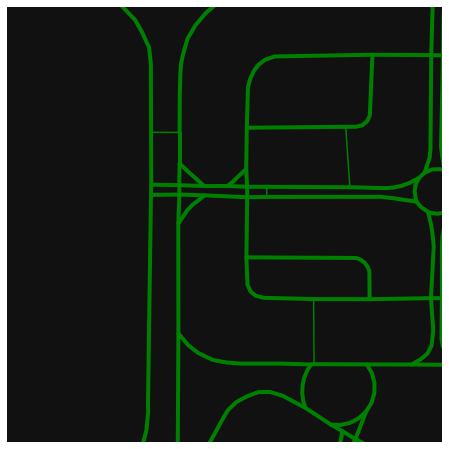

In [10]:
tags = {'building' : True}
point = ((north+south)/2, (east+west)/2)
gdf = ox.geometries_from_bbox(north, south, east, west, tags=tags)
fig, ax = ox.plot_figure_ground(
        point=point,
        dist=281.6, # (.55 * 1024)/2
        edge_color='g',
        network_type="all",
        default_width=4,
        street_widths=None,
        save=False,
        show=True,
        close=True
    )

In [11]:
fp = "./imgs/BLD00096_PS3_K3A_NIA0276.png"
fig, ax = ox.plot_footprints(
    gdf,
    ax=ax, 
    save=True, 
    show=False, 
    close=True,
    bbox=(north, south, east, west),
    color='r',
    filepath=fp,
    dpi=200
)
plt.figure(figsize=(15,15))
plt.show()

/home/aiffel-dj1/anaconda3/envs/aiffel/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Figure size 1080x1080 with 0 Axes>

/home/aiffel-dj1/anaconda3/envs/aiffel/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


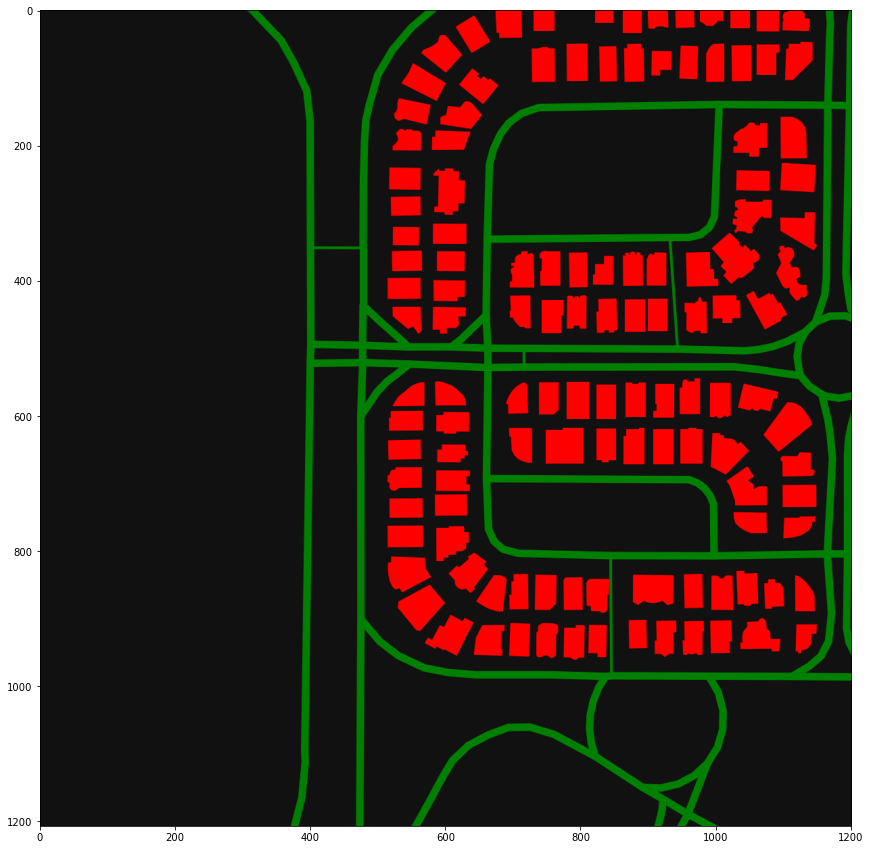

In [12]:
footprint = cv2.imread(fp)
plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(footprint, cv2.COLOR_BGR2RGB))
plt.show()

### C. overlay with raw image

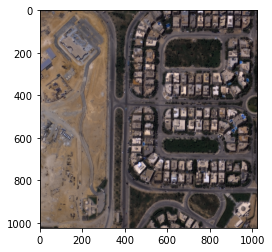

(1024, 1024, 3)

In [13]:
background = cv2.imread(SAMPLE_BACKGROUND_PATH)
plt.imshow(cv2.cvtColor(background, cv2.COLOR_BGR2RGB))
plt.show()
background.shape

In [14]:
footprint.shape

(1207, 1201, 3)

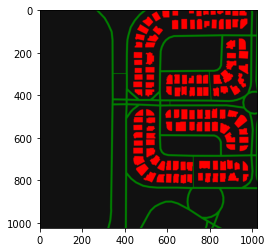

(1024, 1024, 3)

In [15]:
footprint_resize = cv2.resize(footprint, (1024,1024), cv2.INTER_AREA)
plt.imshow(cv2.cvtColor(footprint_resize, cv2.COLOR_BGR2RGB))
plt.show()

footprint_resize.shape

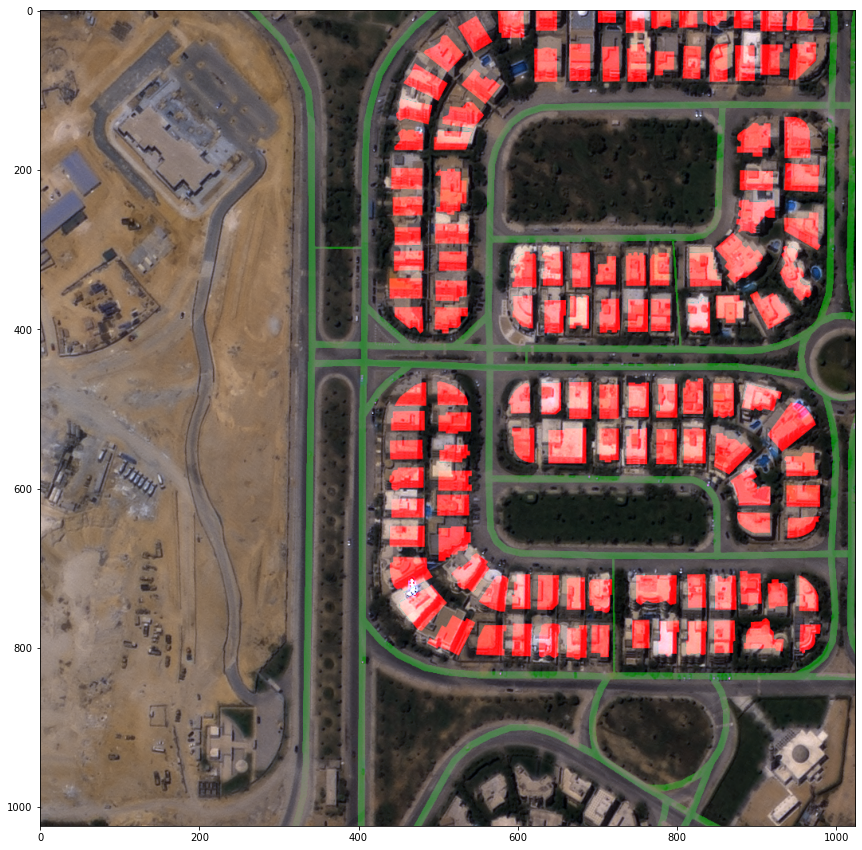

In [16]:
merged = np.where(footprint_resize > 100, footprint_resize, background).astype(np.uint8)
plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(merged, cv2.COLOR_BGR2RGB))
plt.show()

### D. 자연환경 추출
- osm building는 현재 가지고 있는 이미지와의 격차가 크다.
- 전체 - (도로 + 절대 건물일 수 없는 곳의 정보) = (건물 위치 후보)

In [17]:
SAMPLE_TIFF_PATH = os.path.join(DATA_PATH, 'buildings/validation/raw/BLD00007_PS4_K3A_NIA0276.tif') # sample geojson file path
SAMPLE_BACKGROUND_PATH = os.path.join(DATA_PATH, 'buildings/training/raw/BLD00007_PS3_K3A_NIA0276.png')

src = rasterio.open(SAMPLE_TIFF_PATH)
left, bottom, right, top  = transform_bounds(
    src.crs,
    {'init': 'EPSG:4326'},
    src.bounds.left,
    src.bounds.bottom,
    src.bounds.right,
    src.bounds.top)
north, south, east, west = top, bottom, right, left
point = ((north+south)/2, (east+west)/2)

In [18]:
tags = {'natural' : True,
        'water':True, 
        'waterway':True, 
        'landuse':['forest','grass'],
        'sac_scale': True}
# tags = {'building' : True,
#         'landuse': ['commercial', 'construction', 'education', 'industrial', 'residential', 'retail']}
point = ((north+south)/2, (east+west)/2)
gdf = ox.geometries_from_point(point, tags=tags,dist=281.6)
gdf

,geometry


---
---
---

## 2. ROAD DATASET 생성

### A. path 설정

In [5]:
%matplotlib inline
import json
import os
import glob
import folium
import csv
import re
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

from shapely import wkt
from shapely import affinity
from tqdm.notebook import tqdm
import shapely
import osmnx

import rasterio
from rasterio.plot import show

import numpy as np

import cv2

from rasterio.warp import transform_bounds
from rasterio.crs import CRS

In [6]:
BASE_PATH = os.path.join(os.getenv('HOME'), 'workspace/Hackerton') # project folder
DATA_PATH = os.path.join(BASE_PATH, 'RSI_OP_NIA_AIHUB') # data folder

roads_train_tiff_pattern = os.path.join(DATA_PATH, f'roads/training/raw/*.tif')
roads_train_tiff_paths = glob.glob(roads_train_tiff_pattern)

roads_val_tiff_pattern = os.path.join(DATA_PATH, f'roads/validation/raw/*.tif')
roads_val_tiff_paths = glob.glob(roads_val_tiff_pattern)

roads_train_save_dir = './res/training'
roads_val_save_dir = './res/val'

In [7]:
!mkdir -p ./res/training
!mkdir -p ./res/val

### B. road layer 추출 및 저장

In [8]:
def transform_smw_to_4326(src):
    left, bottom, right, top = transform_bounds(
        src.crs, 
        {'init': 'EPSG:4326'},
        src.bounds.left,
        src.bounds.bottom,
        src.bounds.right,
        src.bounds.top)
    return top, bottom, right, left # north, south, east, west

In [9]:
get_dist = lambda path: (.55 * 1024)/2 if '_K3A_' in path else (.7 * 1024)/2

In [10]:
def save_road_graph(tiff_path, save_dir):
    name = tiff_path.split('/')[-1].split('.')[0]
    fp = os.path.join(save_dir, name + '.png')

    if os.path.isfile(fp):
        return
    
    with rasterio.open(tiff_path) as src:
        north, south, east, west = transform_smw_to_4326(src)
        point = ((north+south)/2, (east+west)/2)
        dist = get_dist(name)
        
        try:
            fig, ax = osmnx.plot_figure_ground(
                point=point,
                dist=dist,
                edge_color='w',
                network_type="all",
                default_width=4,
                filepath=fp,
                save=True,
                show=False,
                close=True
            )
        except ValueError:
            empty = np.zeros((1024,1024,3))
            cv2.imwrite(fp, empty)

In [11]:
# error test
save_road_graph(roads_train_tiff_paths[78], roads_train_save_dir)
roads_train_tiff_paths[78]

'/home/aiffel-dj1/workspace/Hackerton/RSI_OP_NIA_AIHUB/roads/training/raw/BLD00849_PS4_K3A_NIA0277.tif'

In [12]:
for path in tqdm(roads_train_tiff_paths):
    save_road_graph(path, roads_train_save_dir)

  0%|          | 0/1144 [00:00<?, ?it/s]

In [13]:
for path in tqdm(roads_val_tiff_paths):
    save_road_graph(path, roads_val_save_dir)

  0%|          | 0/127 [00:00<?, ?it/s]

- test

In [90]:
def show_overlay(IMG_PATH, ROAD_LAYER_PATH):
    background = cv2.imread(IMG_PATH)
    road_layer = cv2.imread(ROAD_LAYER_PATH)
    road_layer = cv2.resize(road_layer, dsize=(1024, 1024), interpolation=cv2.INTER_AREA)
    
    merged = np.where(road_layer > 200, 255, background).astype(np.uint8)
    plt.figure(figsize=(10,10))
    plt.imshow(cv2.cvtColor(merged, cv2.COLOR_BGR2RGB))
    plt.show()

In [91]:
import re
change_PS3 = lambda name: re.sub('_PS4_', '_PS3_', name) 
change_PNG = lambda name: re.sub('tif', 'png', name) 

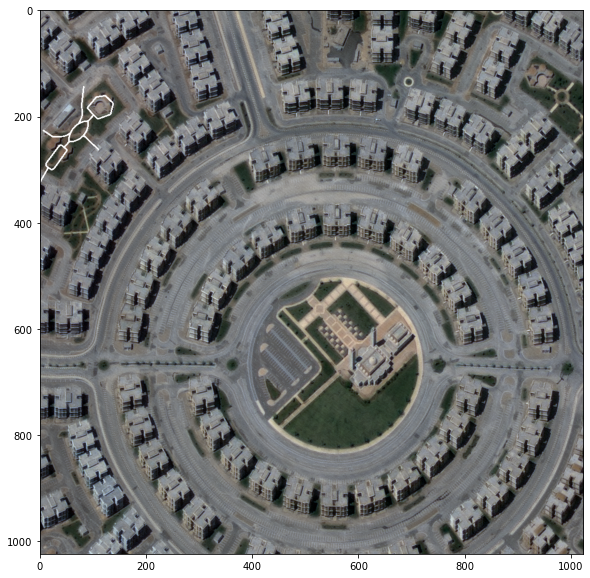

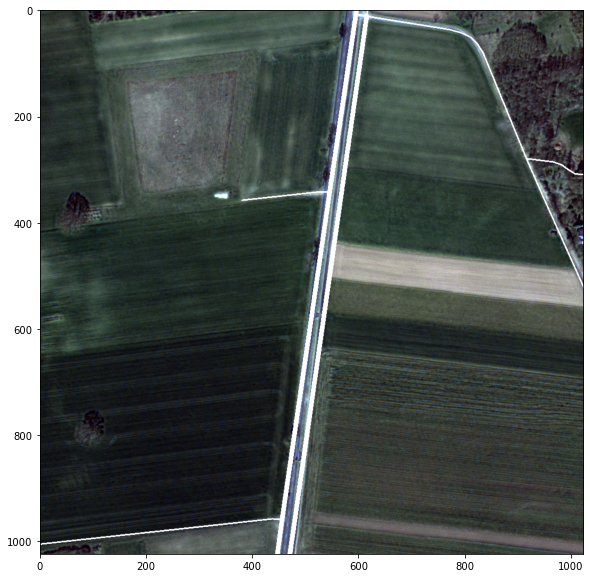

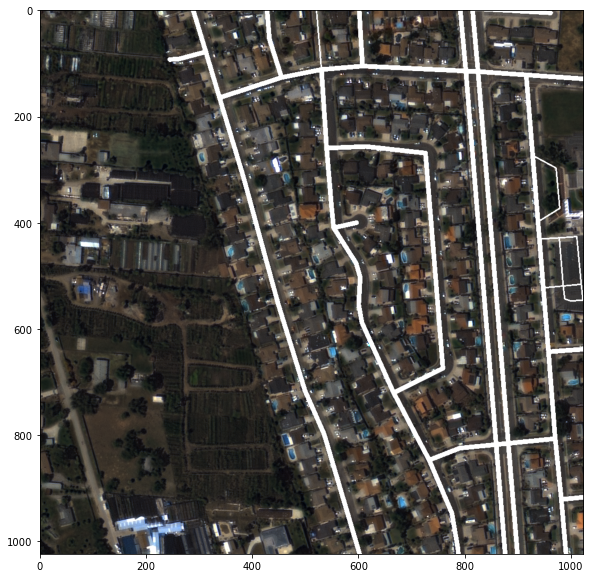

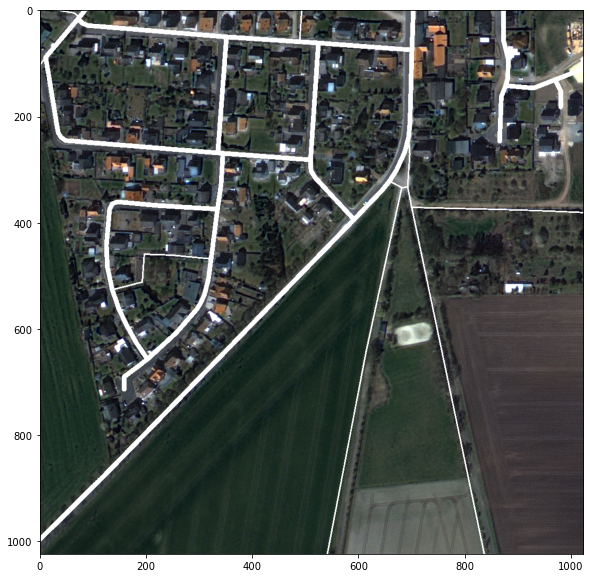

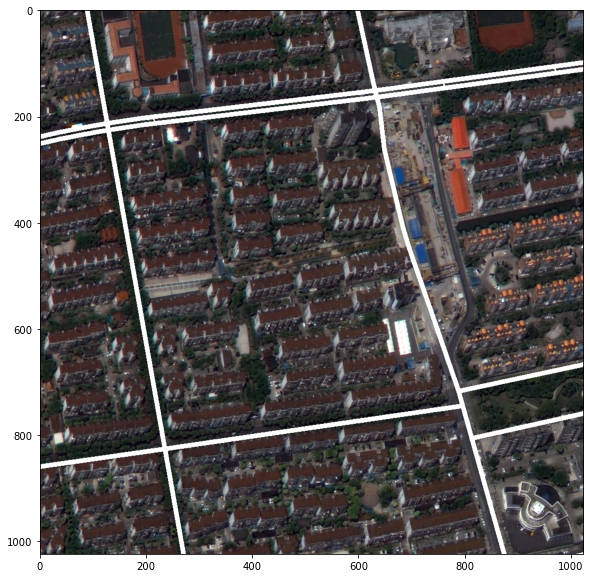

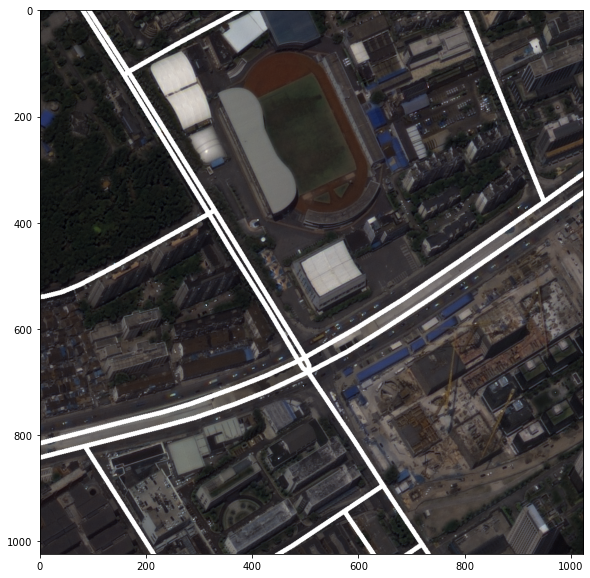

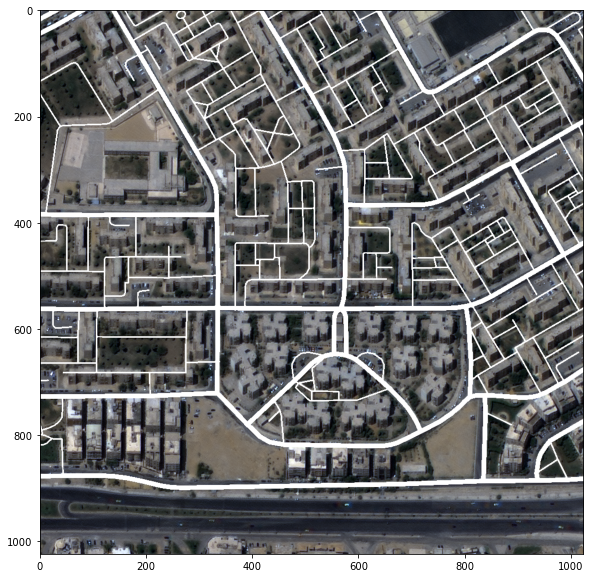

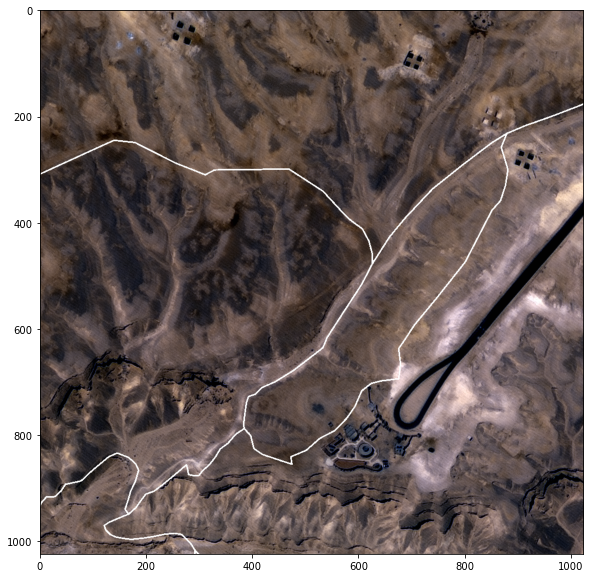

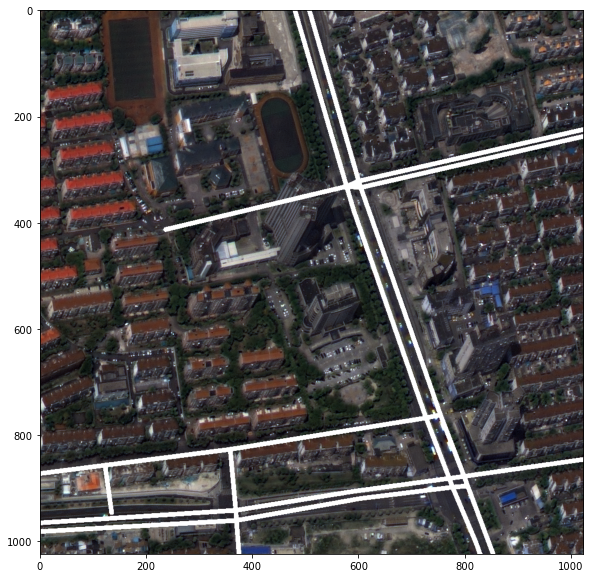

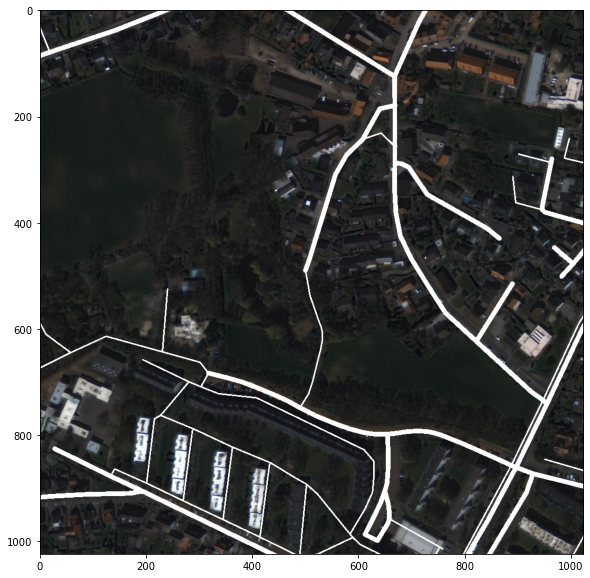

In [95]:
for idx in range(10):
    name = roads_train_tiff_paths[idx].split('/')[-1].split('.')[0]
    fp = os.path.join(roads_train_save_dir, name + '.png')
    bg_img_path = change_PNG(change_PS3(roads_train_tiff_paths[idx]))

    show_overlay(bg_img_path, fp)

---
---
---

## 3. 데이터 합치기

goal
- PNG(3 cha) + TIF-NIR(1 cha) + OSM layer(1 cha)를 합친 데이터(1024,1024,5) 생성한다.
- 이를 모아 h5로 저장한다.

In [194]:
%env SM_FRAMEWORK=tf.keras
import segmentation_models as sm
import albumentations as A

env: SM_FRAMEWORK=tf.keras


### A. SAMPLE

In [195]:
SAMPLE_ROAD_LAYER_PATH = './res/training/BLD00096_PS4_K3A_NIA0276.png'

In [196]:
SAMPLE_TIFF_PATH, SAMPLE_TIFF_PATH, SAMPLE_ROAD_LAYER_PATH

('/home/aiffel-dj1/workspace/Hackerton/RSI_OP_NIA_AIHUB/buildings/validation/raw/BLD00096_PS4_K3A_NIA0276.tif',
 '/home/aiffel-dj1/workspace/Hackerton/RSI_OP_NIA_AIHUB/buildings/validation/raw/BLD00096_PS4_K3A_NIA0276.tif',
 './res/training/BLD00096_PS4_K3A_NIA0276.png')

(1024, 1024, 3) (1024, 1024, 1) (1024, 1024, 1)


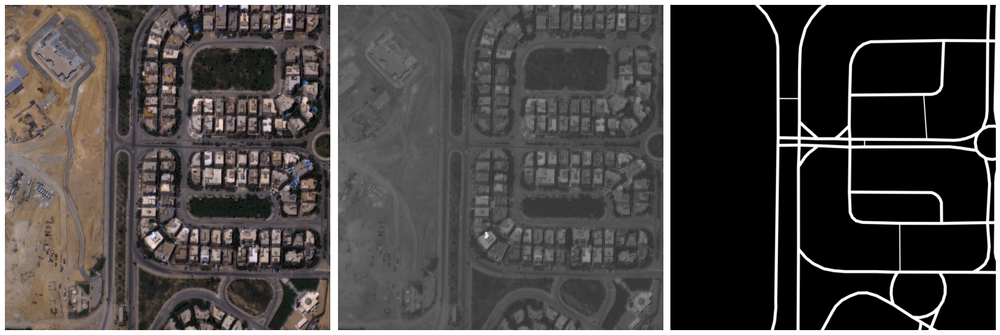

In [219]:
with rasterio.open(SAMPLE_TIFF_PATH) as src:
    bg = cv2.cvtColor(cv2.imread(SAMPLE_BACKGROUND_PATH), cv2.COLOR_BGR2RGB)
    
    nir = src.read(3)
    nir = (nir - nir.min()) / (nir.max() - nir.min())
    nir = np.reshape(nir, (1024, 1024, 1))

    road_layer = cv2.imread(SAMPLE_ROAD_LAYER_PATH, cv2.IMREAD_GRAYSCALE)
    road_layer = cv2.resize(road_layer, dsize=(1024, 1024), interpolation=cv2.INTER_AREA)
    road_layer = np.reshape(road_layer, (1024, 1024, 1))
    
    print(bg.shape, nir.shape, road_layer.shape)
    
    plt.figure(figsize=(20, 10))
    plt.subplot(131)
    plt.axis('off')
    plt.imshow(bg)
    
    plt.subplot(132)
    plt.imshow(nir, cmap='gray')
    plt.axis('off')
    
    plt.subplot(133)
    plt.imshow(road_layer, cmap='gray')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

In [220]:
merged = np.concatenate((bg, nir, road_layer), axis=2)
merged.shape

(1024, 1024, 5)

In [221]:
def show_5_channel(img):
    plt.figure(figsize=(20, 10))

    plt.subplot(131)
    plt.imshow(img[:,:, :3].astype(np.uint8))
    plt.axis('off') 

    plt.subplot(132)
    plt.imshow(img[:,:, 3], cmap='gray')
    plt.axis('off')

    plt.subplot(133)
    plt.imshow(img[:,:, 4], cmap='gray')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

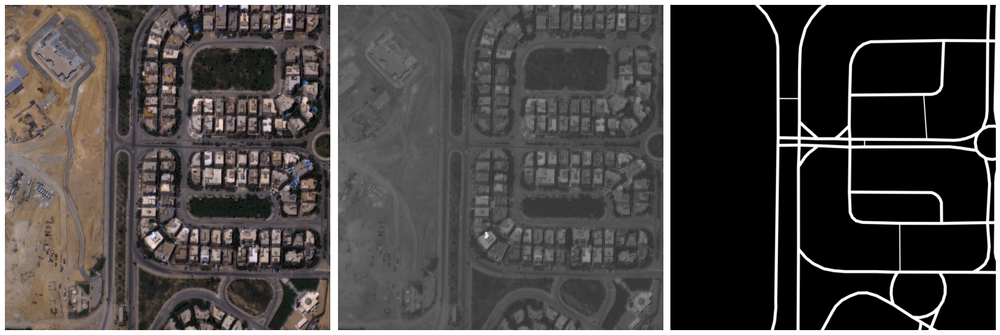

In [222]:
show_5_channel(merged)

- preprocessing test - efficientnetb3

In [223]:
preprocess_input = sm.get_preprocessing('efficientnetb3')

In [224]:
preprocessed_img = preprocess_input(merged)
preprocessed_img.shape

(1024, 1024, 5)

In [225]:
for i in range(5):
    img = preprocessed_img[:, :, i]
    print(f'min: {img.min()}, max: {img.max()}')

min: -2.1007791762993406, max: 2.2489082969432315
min: -2.018207282913165, max: 2.428571428571429
min: -1.7870152505446624, max: 2.6399999999999997
min: 0.0, max: 0.00392156862745098
min: 0.06666666666666667, max: 1.0


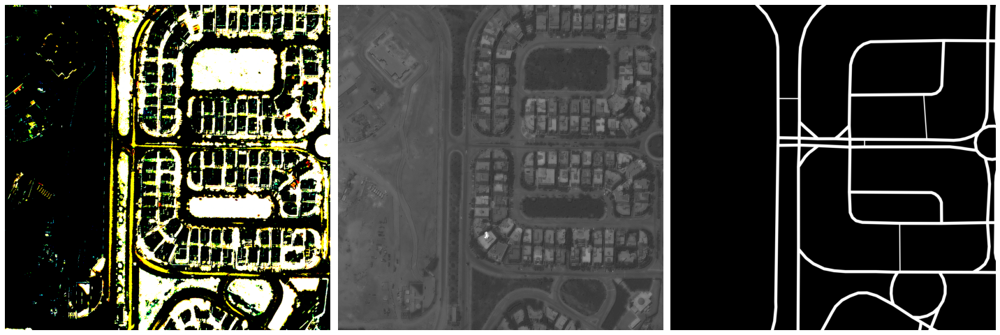

In [226]:
show_5_channel(preprocessed_img)

In [230]:
preprocessed_img.shape

(1024, 1024, 5)

### B. Merged Dataset 생성
각 데이터는 아래와 같은 작업을 거친 후 합쳐진다.
- png : cvtColor(BGR2RGB)
- tiff : nir 채널 추출 후 0~1 사이로 정규화, (1024,1024,1)로 reshape
- road_layer ; IMREAD_GRAYSCALE로 읽어들이기, resize(1024,1024),  (1024,1024,1)로 reshape

#### a. path 설정

In [252]:
def tiff_path_to_png_path(path):
    png_path = re.sub('_PS4_', '_PS3_', path)
    png_path = re.sub('tif', 'png', png_path)
    return png_path

def png_path_to_tiff_path(path):
    tif_path = re.sub('_PS3_', '_PS4_', path)
    tif_path = re.sub('png', 'tif', tif_path)
    return tif_path

In [259]:
BASE_PATH = os.path.join(os.getenv('HOME'), 'workspace/Hackerton') # project folder
DATA_PATH = os.path.join(BASE_PATH, 'RSI_OP_NIA_AIHUB') # data folder

ROADS_TRAIN_RAW_DIR = os.path.join(DATA_PATH, 'roads/training/raw')
ROADS_VAL_RAW_DIR = os.path.join(DATA_PATH, 'roads/validation/raw')

ROADS_TRAIN_LABEL_DIR = os.path.join(DATA_PATH, 'roads/training/label')
ROADS_VAL_LABEL_DIR = os.path.join(DATA_PATH, 'roads/validation/label')

ROAD_TRAIN_LAYER_dir = './res/training'
ROAD_VAL_LAYER_dir = './res/val'

H5_FILE = './res/LV1_DATASET_R_5CHA.h5'

R_TRIAN_LIST_TXT = './res/list/R_train_list.txt'
R_VAL_LIST_TXT = './res/list/R_val_list.txt'
R_TEST_LIST_TXT = './res/list/R_test_list.txt'

In [235]:
import h5py

#### b. 데이터셋 목록 불러오기

In [241]:
with open(R_TRIAN_LIST_TXT) as f:
    train_names = f.readlines()
    train_names = [re.sub('\n', '', name) for name in train_names]
    print(train_names[:3])

['BLD00001_PS3_K3A_NIA0276.png', 'BLD00003_PS3_K3A_NIA0276.png', 'BLD00006_PS3_K3A_NIA0276.png']


In [242]:
with open(R_VAL_LIST_TXT) as f:
    val_names = f.readlines()
    val_names = [re.sub('\n', '', name) for name in val_names]
    print(val_names[:3])

['BLD00019_PS3_K3A_NIA0276.png', 'BLD00038_PS3_K3A_NIA0276.png', 'BLD00055_PS3_K3A_NIA0276.png']


In [243]:
with open(R_TEST_LIST_TXT) as f:
    test_names = f.readlines()
    test_names = [re.sub('\n', '', name) for name in test_names]
    print(test_names[:3])

['BLD00002_PS3_K3A_NIA0276.png', 'BLD00010_PS3_K3A_NIA0276.png', 'BLD00029_PS3_K3A_NIA0276.png']


#### c. 데이터 병합 및 저장

- sample

In [255]:
sample_png_path = os.path.join(ROADS_TRAIN_RAW_DIR, train_names[0])
sample_tif_path = png_path_to_tiff_path(sample_png)
layer_path = os.path.join(ROAD_TRAIN_LAYER_dir, re.sub('_PS3_', '_PS4_', train_names[0]))

print(f'sample_png_path : {sample_png_path}')
print(f'sample_tif_path: {sample_tif_path}')
print(f'layer_path: {layer_path}')

sample_png_path : /home/aiffel-dj1/workspace/Hackerton/RSI_OP_NIA_AIHUB/roads/training/raw/BLD00001_PS3_K3A_NIA0276.png
sample_tif_path: /home/aiffel-dj1/workspace/Hackerton/RSI_OP_NIA_AIHUB/roads/training/raw/BLD00001_PS4_K3A_NIA0276.tif
layer_path: ./res/training/BLD00001_PS4_K3A_NIA0276.png


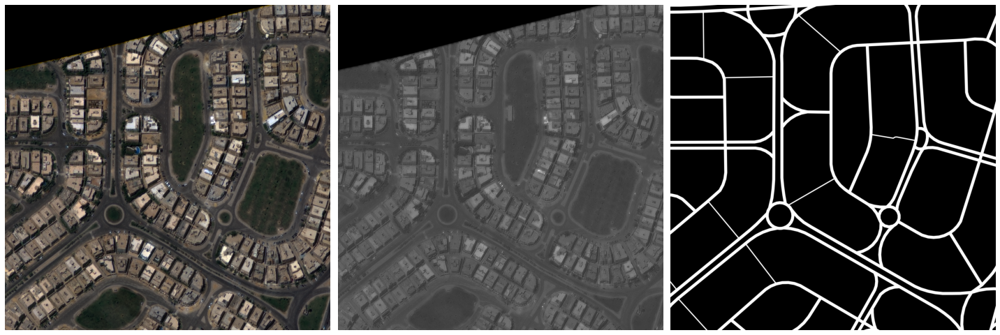

In [274]:
with rasterio.open(sample_tif_path) as src:
    bg = cv2.cvtColor(cv2.imread(sample_png_path), cv2.COLOR_BGR2RGB)
    
    nir = src.read(3)
    nir = (nir - nir.min()) / (nir.max() - nir.min())*255
    nir = np.reshape(nir, (1024, 1024, 1))

    road_layer = cv2.imread(layer_path, cv2.IMREAD_GRAYSCALE)
    road_layer = cv2.resize(road_layer, dsize=(1024, 1024), interpolation=cv2.INTER_AREA)
    road_layer = np.reshape(road_layer, (1024, 1024, 1))
    
    merged = np.concatenate((bg, nir, road_layer), axis=2).astype(np.uint8)
    show_5_channel(merged)

- train

In [297]:
with h5py.File(H5_FILE) as h5:
    key = 'train'
    if key in h5.keys() : del h5[key]
    group = h5.create_group(key)
    group.create_dataset('img', (len(train_names), 1024, 1024, 5), np.uint8)
    group.create_dataset('label', (len(train_names), 1024, 1024, 3), np.uint8)

    # write the images
    for i in tqdm(range(shape[0]), desc=f'Write {key} image'):
        png_path = os.path.join(ROADS_TRAIN_RAW_DIR, train_names[i])
        tif_path = png_path_to_tiff_path(png_path)
        layer_path = os.path.join(ROAD_TRAIN_LAYER_dir, re.sub('_PS3_', '_PS4_', train_names[i]))
        label_path = os.path.join(ROADS_TRAIN_LABEL_DIR, train_names[i])
        
        with rasterio.open(tif_path) as src:
            bg = cv2.cvtColor(cv2.imread(png_path), cv2.COLOR_BGR2RGB)

            nir = src.read(3)
            nir = (nir - nir.min()) / (nir.max() - nir.min())*255
            nir = np.reshape(nir, (1024, 1024, 1))

            road_layer = cv2.imread(layer_path, cv2.IMREAD_GRAYSCALE)
            road_layer = cv2.resize(road_layer, dsize=(1024, 1024), interpolation=cv2.INTER_AREA)
            road_layer = np.reshape(road_layer, (1024, 1024, 1))
            
            merged = np.concatenate((bg, nir, road_layer), axis=2).astype(np.uint8)    
            label = cv2.cvtColor(cv2.imread(label_path), cv2.COLOR_BGR2RGB)

            group['img'][i, ...] = merged
            group['label'][i, ...] = label

Write train image:   0%|          | 0/1024 [00:00<?, ?it/s]

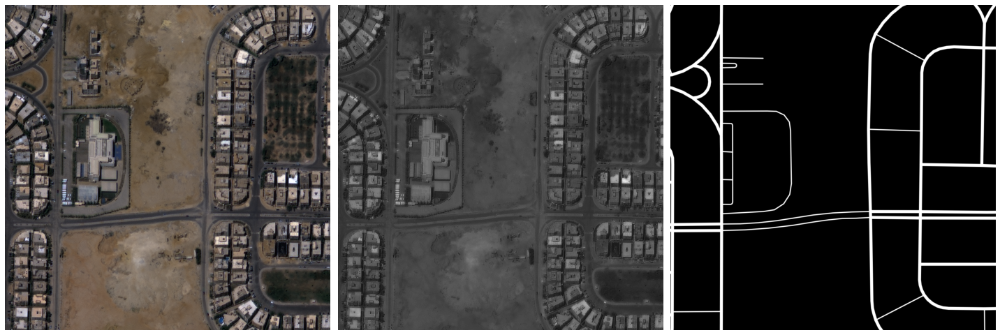

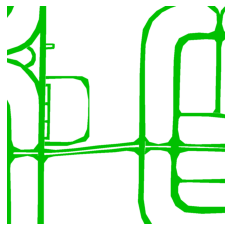

In [298]:
with h5py.File(H5_FILE, 'r') as h5:
    show_5_channel(h5['train']['img'][10])
    plt.show()
    
    plt.imshow(h5['train']['label'][10])
    plt.axis('off')
    plt.show()

- validation

In [299]:
with h5py.File(H5_FILE) as h5:
    key = 'val'
    if key in h5.keys() : del h5[key]
    group = h5.create_group(key)
    group.create_dataset('img', (len(val_names), 1024, 1024, 5), np.uint8)
    group.create_dataset('label', (len(val_names), 1024, 1024, 3), np.uint8)

    # write the images
    for i in tqdm(range(len(val_names)), desc=f'Write {key} image'):
        png_path = os.path.join(ROADS_TRAIN_RAW_DIR, val_names[i])
        tif_path = png_path_to_tiff_path(png_path)
        layer_path = os.path.join(ROAD_TRAIN_LAYER_dir, re.sub('_PS3_', '_PS4_', val_names[i]))
        label_path = os.path.join(ROADS_TRAIN_LABEL_DIR, val_names[i])
        
        with rasterio.open(tif_path) as src:
            bg = cv2.cvtColor(cv2.imread(png_path), cv2.COLOR_BGR2RGB)

            nir = src.read(3)
            nir = (nir - nir.min()) / (nir.max() - nir.min())*255
            nir = np.reshape(nir, (1024, 1024, 1))

            road_layer = cv2.imread(layer_path, cv2.IMREAD_GRAYSCALE)
            road_layer = cv2.resize(road_layer, dsize=(1024, 1024), interpolation=cv2.INTER_AREA)
            road_layer = np.reshape(road_layer, (1024, 1024, 1))
            
            merged = np.concatenate((bg, nir, road_layer), axis=2).astype(np.uint8)    
            label = cv2.cvtColor(cv2.imread(label_path), cv2.COLOR_BGR2RGB)

            group['img'][i, ...] = merged
            group['label'][i, ...] = label

Write val image:   0%|          | 0/120 [00:00<?, ?it/s]

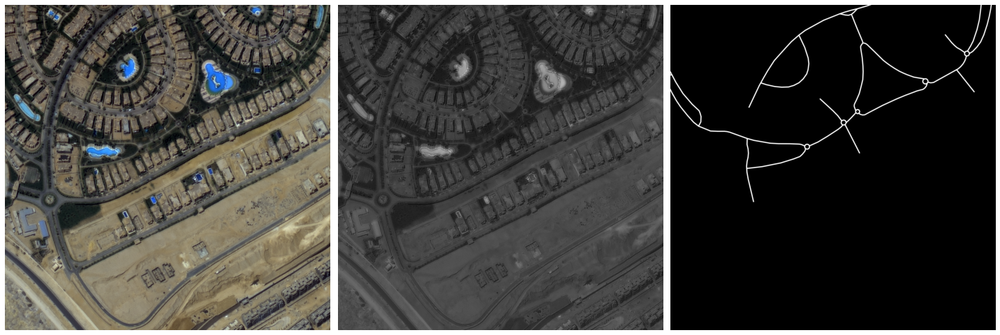

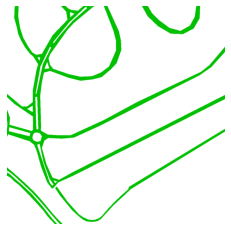

In [300]:
with h5py.File(H5_FILE, 'r') as h5:
    show_5_channel(h5['val']['img'][10])
    plt.show()
    
    plt.imshow(h5['val']['label'][10])
    plt.axis('off')
    plt.show()

- test

In [304]:
with h5py.File(H5_FILE) as h5:
    key = 'test'
    if key in h5.keys() : del h5[key]
    group = h5.create_group(key)
    group.create_dataset('img', (len(test_names), 1024, 1024, 5), np.uint8)
    group.create_dataset('label', (len(test_names), 1024, 1024, 3), np.uint8)

    # write the images
    for i in tqdm(range(len(test_names)), desc=f'Write {key} image'):
        png_path = os.path.join(ROADS_VAL_RAW_DIR, test_names[i])
        tif_path = png_path_to_tiff_path(png_path)
        layer_path = os.path.join(ROAD_VAL_LAYER_dir, re.sub('_PS3_', '_PS4_', test_names[i]))
        label_path = os.path.join(ROADS_VAL_LABEL_DIR, test_names[i])
        
        with rasterio.open(tif_path) as src:
            bg = cv2.cvtColor(cv2.imread(png_path), cv2.COLOR_BGR2RGB)

            nir = src.read(3)
            nir = (nir - nir.min()) / (nir.max() - nir.min())*255
            nir = np.reshape(nir, (1024, 1024, 1))

            road_layer = cv2.imread(layer_path, cv2.IMREAD_GRAYSCALE)
            road_layer = cv2.resize(road_layer, dsize=(1024, 1024), interpolation=cv2.INTER_AREA)
            road_layer = np.reshape(road_layer, (1024, 1024, 1))
            
            merged = np.concatenate((bg, nir, road_layer), axis=2).astype(np.uint8)    
            label = cv2.cvtColor(cv2.imread(label_path), cv2.COLOR_BGR2RGB)

            group['img'][i, ...] = merged
            group['label'][i, ...] = label

Write test image:   0%|          | 0/127 [00:00<?, ?it/s]

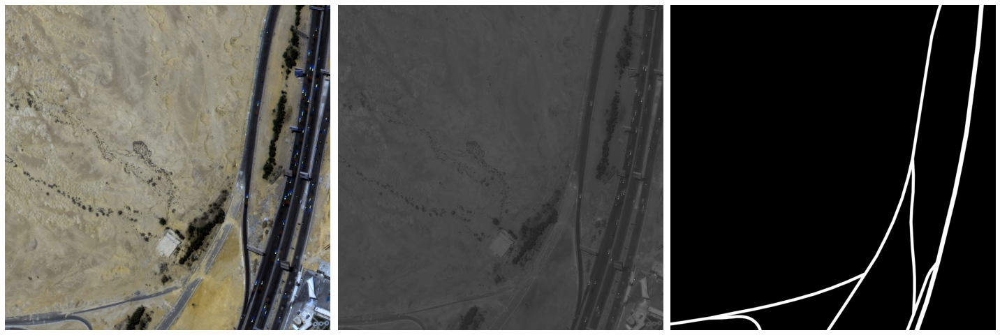

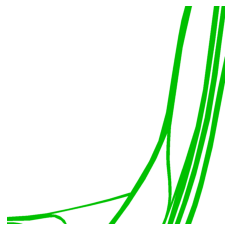

In [305]:
with h5py.File(H5_FILE, 'r') as h5:
    show_5_channel(h5['test']['img'][10])
    plt.show()
    
    plt.imshow(h5['test']['label'][10])
    plt.axis('off')
    plt.show()